Importing all the libraries that we will need for machine learning

In [1]:
#Knn
import numpy as np
from scipy import signal
import matplotlib.pyplot as plt
from matplotlib import cm
from skimage import data, color, img_as_float, img_as_ubyte, filters, feature
from skimage import draw as drw
import matplotlib.ticker as plticker
from PIL import Image, ImageDraw
import matplotlib.patches as patches
import csv
import math
%matplotlib inline
from IPython.display import HTML, display
import numpy as np
from sklearn import preprocessing, cross_validation, neighbors
import pandas as pd
from pandas import DataFrame
import csv
from skimage import data, color, img_as_float, img_as_ubyte, filters, feature
import matplotlib.pyplot as plt
from numpy import genfromtxt
from sklearn import preprocessing
import timeit
from skimage import data, color, img_as_float, img_as_ubyte, filters, feature
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from PIL import ImageFilter
from scipy import ndimage, misc
from skimage import data, color, exposure, img_as_float, img_as_ubyte, filters, morphology

/Applications/anaconda3/lib/python3.6/site-packages/sklearn/cross_validation.py:41: DeprecationWarning: This module was deprecated in version 0.18 in favor of the model_selection module into which all the refactored classes and functions are moved. Also note that the interface of the new CV iterators are different from that of this module. This module will be removed in 0.20.
  "This module will be removed in 0.20.", DeprecationWarning)


Load Retina Image

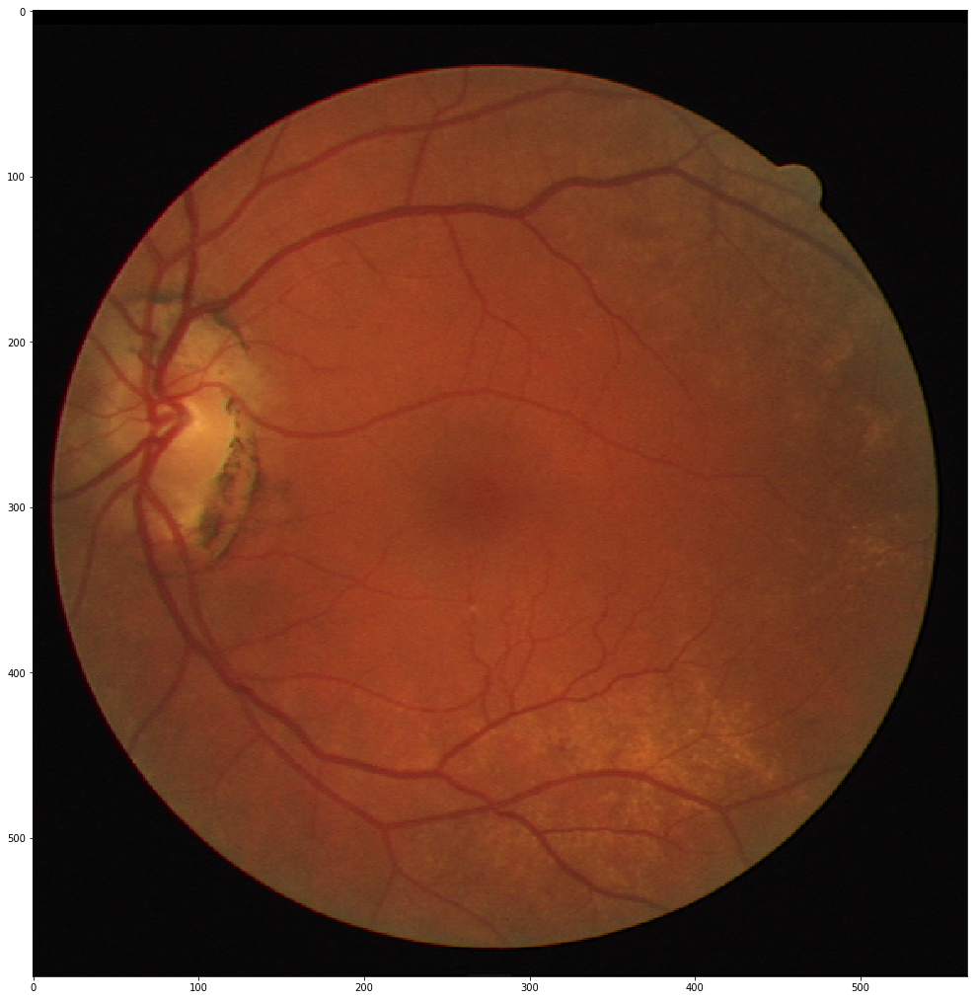

In [2]:
my_image = '26_training.tif' #'03_test.tif' 

# Load and Display Retina Image 
plt.figure(figsize=(20,18))
img=mpimg.imread(my_image)
imgplot = plt.imshow(img)
plt.show()

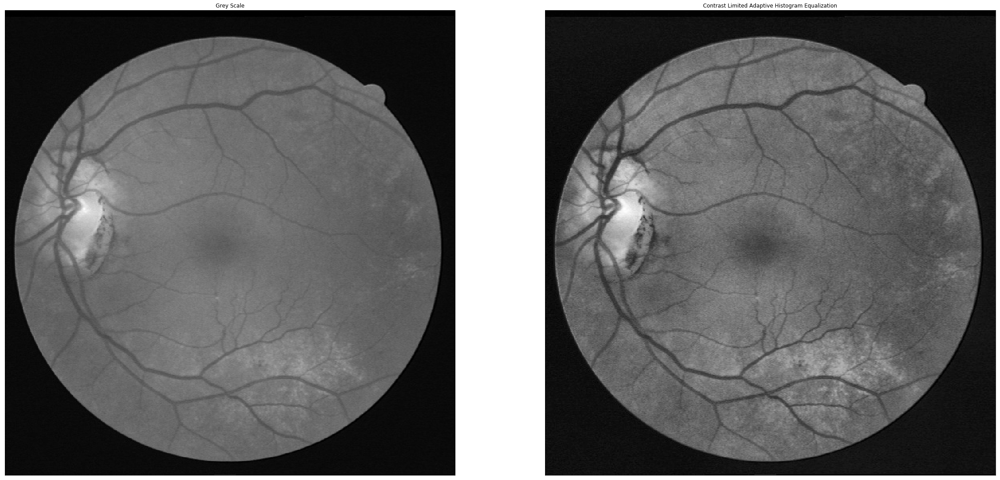

In [3]:
# importing image for testing
retina_image =  my_image 

# Converting image into grey scale 
retina = data.imread(retina_image)
retina_grey = color.rgb2grey(retina)

image = cv2.imread(my_image,0)

# create a CLAHE object.
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
cl1 = clahe.apply(image)
##########################################################

plt.figure(figsize=(40,38))
plt.subplot(121),plt.imshow(retina_grey,cmap="gray"),plt.title('Grey Scale')
plt.xticks([]), plt.yticks([])
plt.subplot(122),plt.imshow(cl1,cmap="gray"),plt.title('Contrast Limited Adaptive Histogram Equalization')
plt.xticks([]), plt.yticks([])
plt.show()


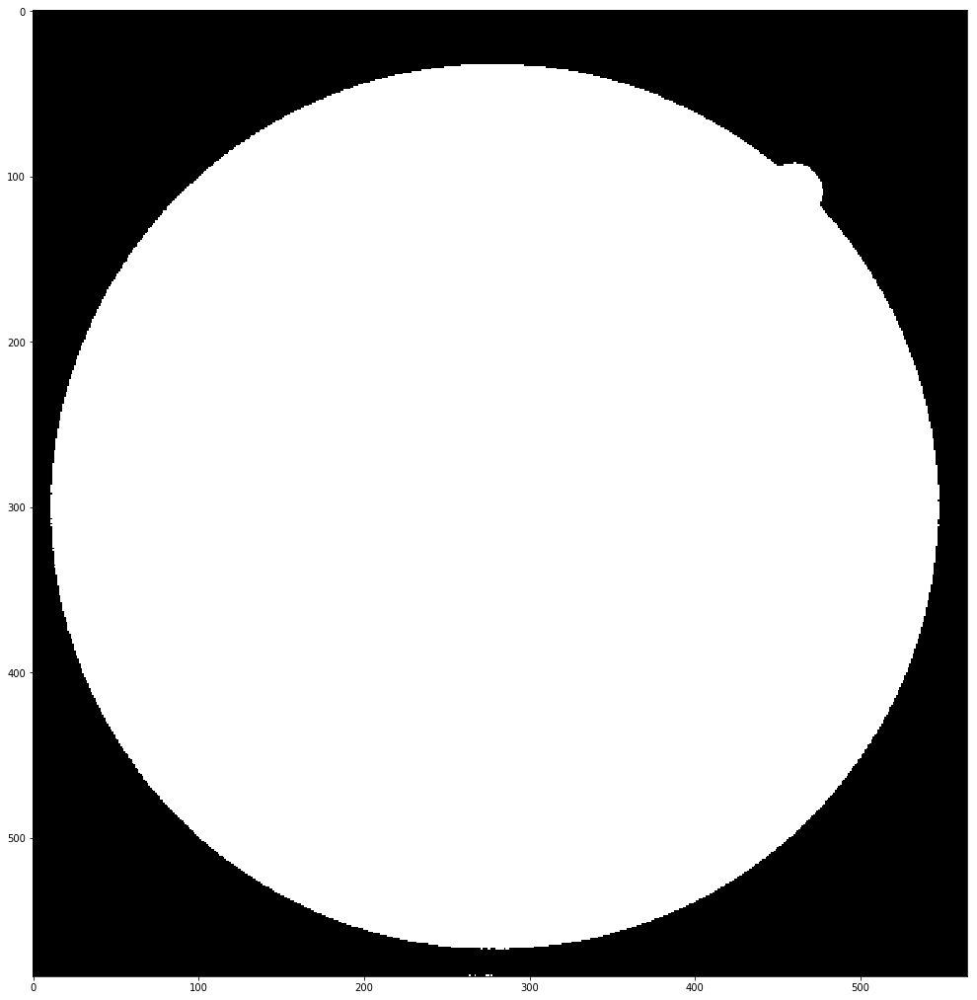

In [4]:
#Convert image to binary image, based on threshold im2bw, Use imbinarize instead.
thresh = 30
im_bw2 = cv2.threshold(cl1, thresh, 255, cv2.THRESH_BINARY)[1]
plt.figure(figsize=(20,18))
plt.imshow(im_bw2,cmap="gray")

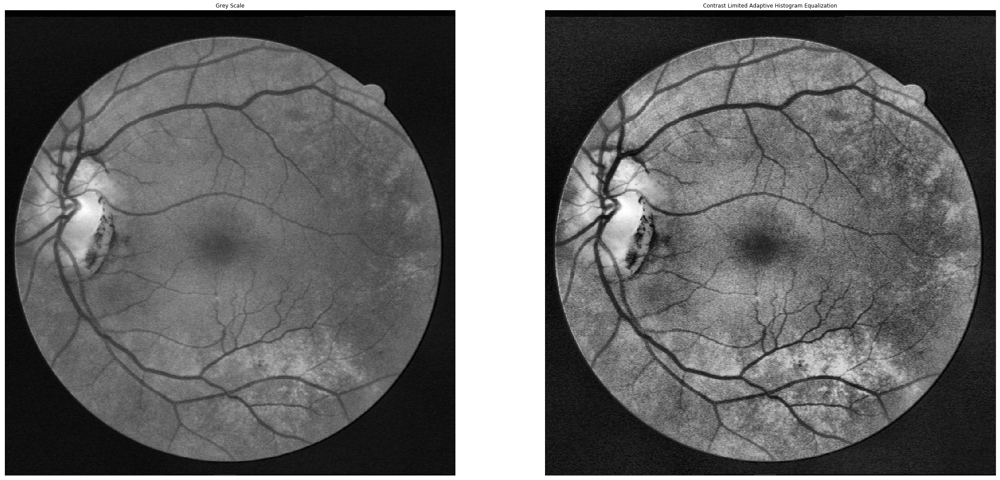

In [5]:
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
cl2 = clahe.apply(cl1 )
##########################################################

plt.figure(figsize=(40,38))
plt.subplot(121),plt.imshow(cl1,cmap="gray"),plt.title('Grey Scale')
plt.xticks([]), plt.yticks([])
plt.subplot(122),plt.imshow(cl2,cmap="gray"),plt.title('Contrast Limited Adaptive Histogram Equalization')
plt.xticks([]), plt.yticks([])
plt.show()



In [6]:
print(im_bw2)

[[0 0 0 ..., 0 0 0]
 [0 0 0 ..., 0 0 0]
 [0 0 0 ..., 0 0 0]
 ..., 
 [0 0 0 ..., 0 0 0]
 [0 0 0 ..., 0 0 0]
 [0 0 0 ..., 0 0 0]]


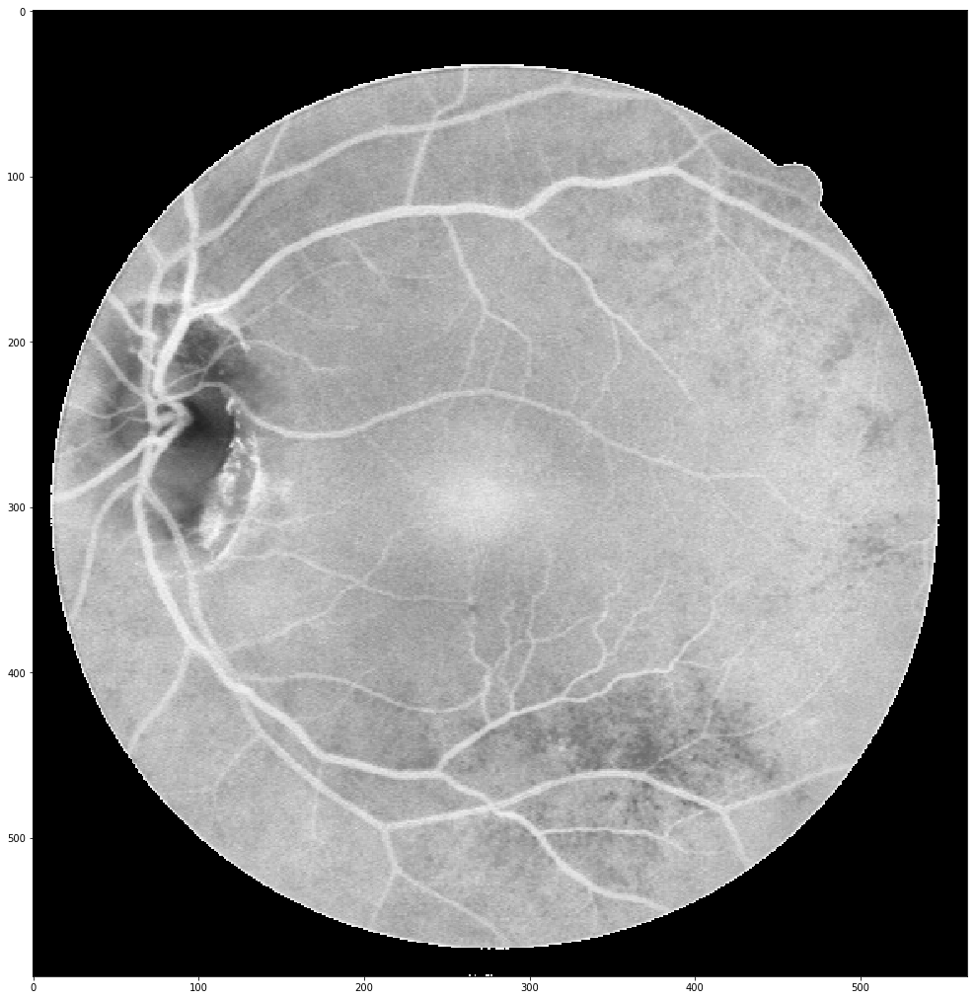

In [7]:
#apply the mask 
plt.figure(figsize=(20,18))
image_mask = cl1*im_bw2
plt.imshow(image_mask,cmap="gray")

                       CLAHE (Contrast Limited Adaptive Histogram Equalization)

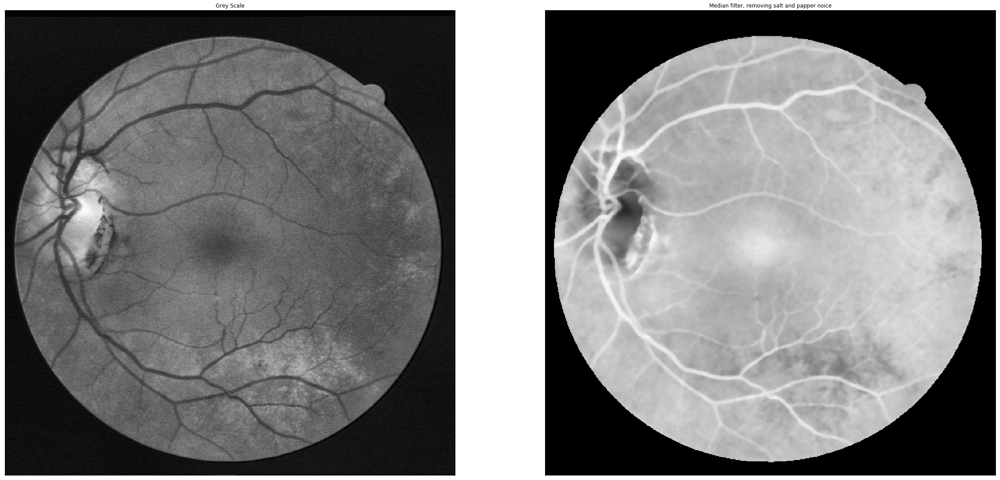

In [8]:
# B = medfilt2(A,[m n]) performs median filtering, where each output pixel contains the median value in the m-by-n 
#neighborhood around the corresponding pixel in the input image.
median = cv2.medianBlur(image_mask,5)


plt.figure(figsize=(40,38))
plt.subplot(121),plt.imshow(cl1,cmap="gray"),plt.title('Grey Scale')
plt.xticks([]), plt.yticks([])
plt.subplot(122),plt.imshow(median,cmap="gray"),plt.title('Median filter, removing salt and papper noice')
plt.xticks([]), plt.yticks([])
plt.show()

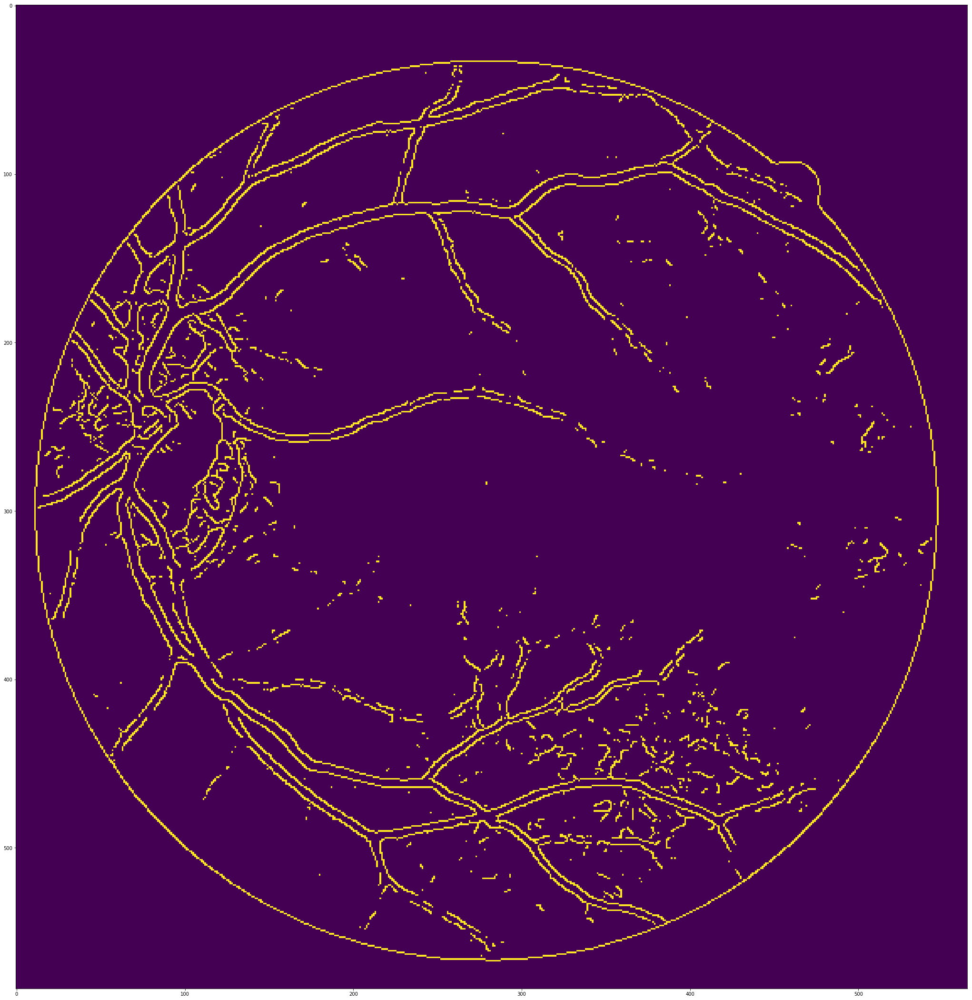

In [9]:
plt.figure(figsize=(40,38))
edges = cv2.Canny(median,50,50)
plt.imshow(edges)

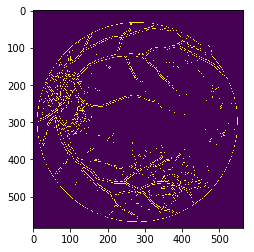

In [10]:
kernel = np.ones((1,1),np.uint8)
erosion = cv2.erode(edges,kernel,iterations = 3)
plt.imshow(erosion)

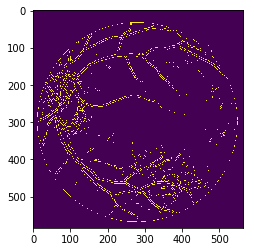

In [11]:
no_edges = im_bw2*edges
plt.imshow(no_edges)

2. Dilation
It is just opposite of erosion. Here, a pixel element is ‘1’ if atleast one pixel under the kernel is ‘1’. So it increases the white region in the image or size of foreground object increases. Normally, in cases like noise removal, erosion is followed by dilation. Because, erosion removes white noises, but it also shrinks our object. So we dilate it. Since noise is gone, they won’t come back, but our object area increases. It is also useful in joining broken parts of an object.

/Applications/anaconda3/lib/python3.6/site-packages/skimage/filters/_gaussian.py:22: skimage_deprecation: Function ``gaussian_filter`` is deprecated. Use ``skimage.filters.gaussian`` instead.
  multichannel=None, preserve_range=False, truncate=4.0):


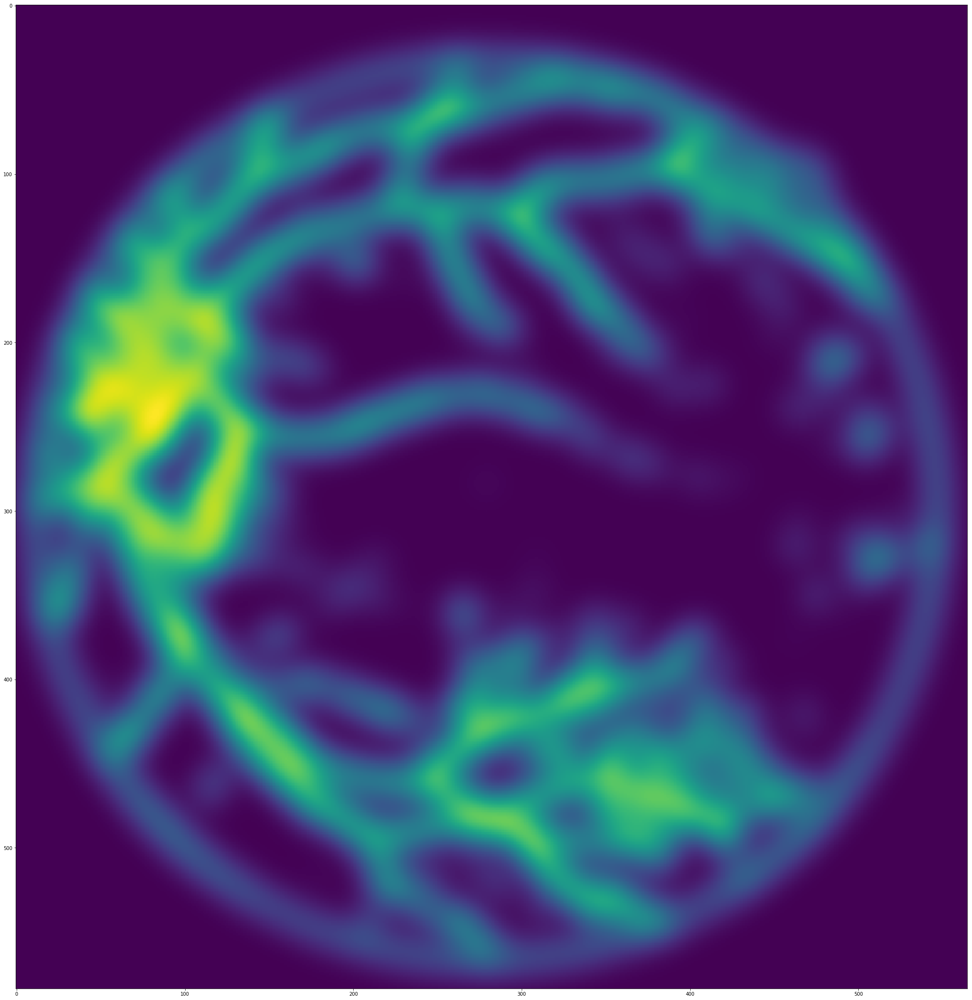

In [12]:
sigma = 10# --- complete here -- #
plt.figure(figsize=(40,38))
img_smooth = filters.gaussian_filter(edges,sigma)# --- complete here -- #
plt.imshow(img_smooth)

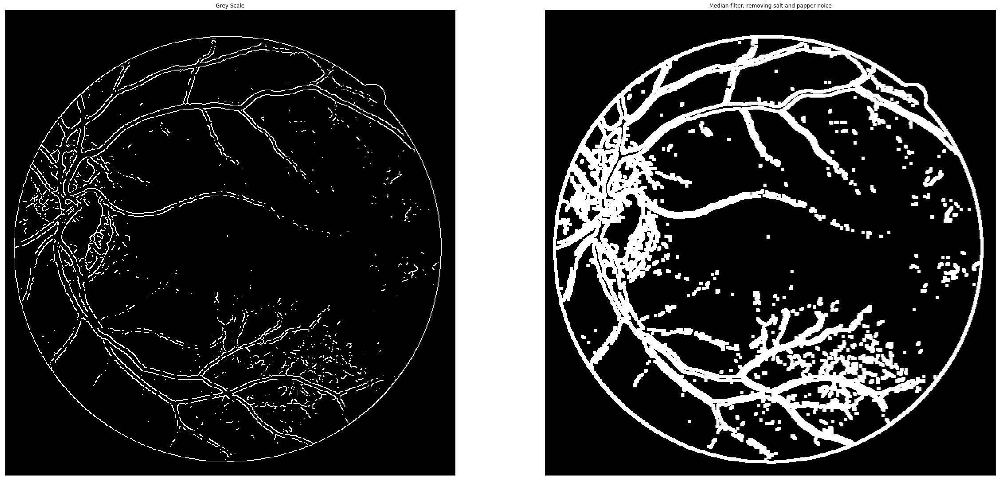

In [13]:
#dilation = cv2.dilate(edges,kernel,iterations = 3)
img_dilation = cv2.dilate(edges, np.ones((4, 4)))

plt.figure(figsize=(40,38))
plt.subplot(121),plt.imshow(edges,cmap="gray"),plt.title('Grey Scale')
plt.xticks([]), plt.yticks([])
plt.subplot(122),plt.imshow(img_dilation,cmap="gray"),plt.title('Median filter, removing salt and papper noice')
plt.xticks([]), plt.yticks([])
plt.show()

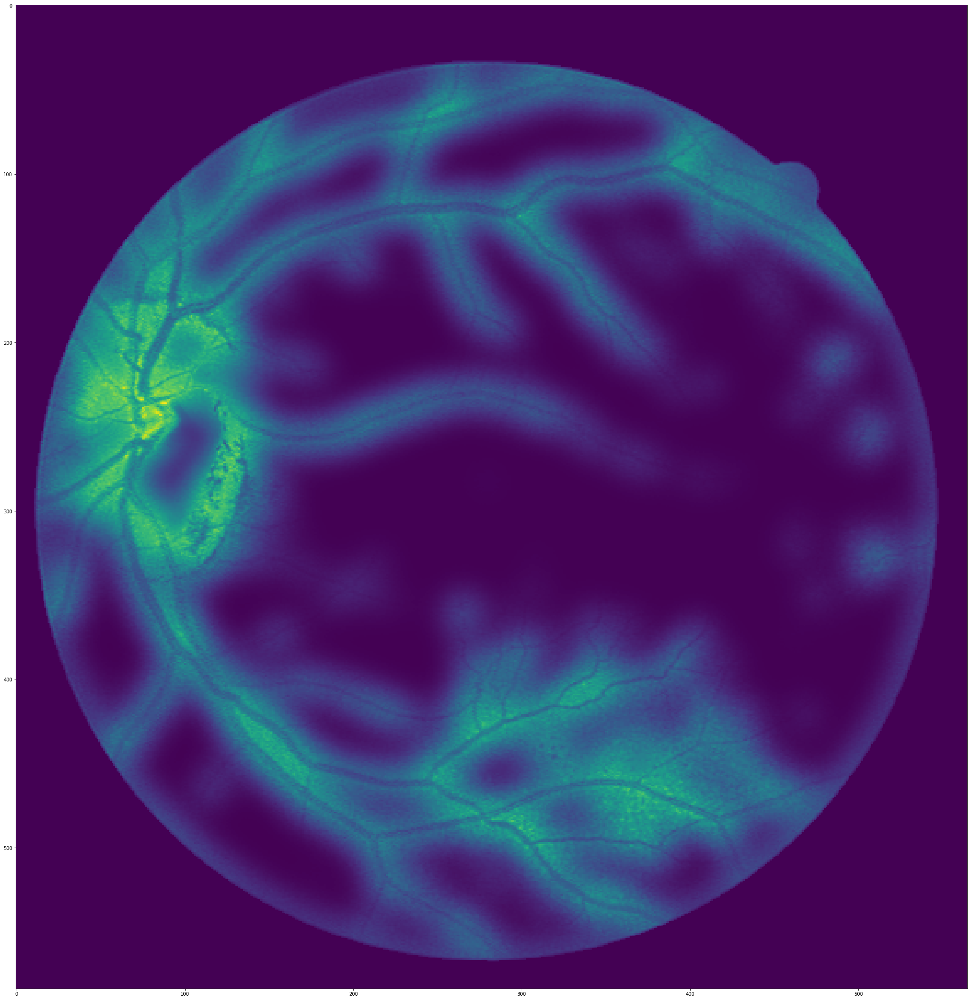

In [14]:
new_img = median*img_smooth*cl1
plt.figure(figsize=(40,38))
plt.imshow(new_img)

In [15]:
img_dilation_mask = img_dilation*im_bw2
df = pd.DataFrame(img_dilation_mask)
df.to_csv('dialation.csv',index = False, header = False )

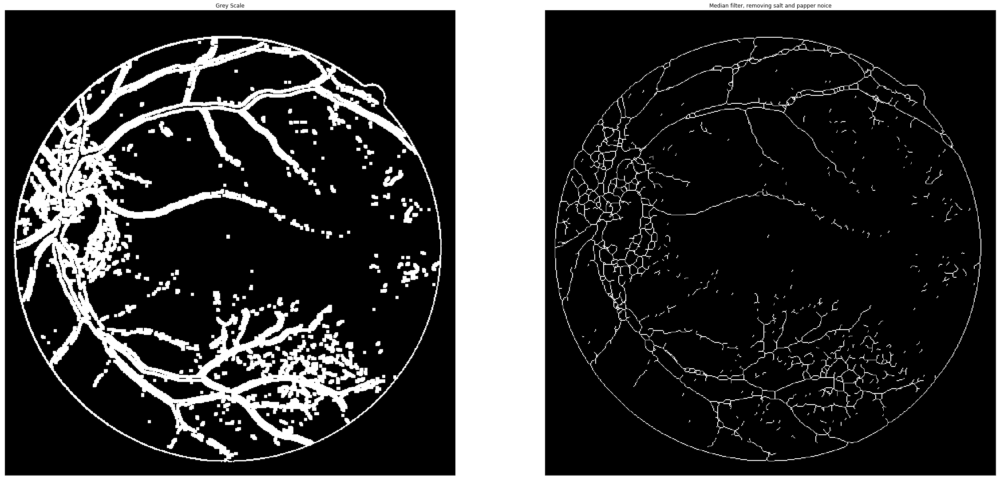

In [16]:
from skimage.morphology import skeletonize
from skimage import data
import matplotlib.pyplot as plt
from skimage.util import invert

# Invert the horse image
image = img_dilation_mask

# perform skeletonization
skeleton = skeletonize(image)

# display results

plt.figure(figsize=(40,38))
plt.subplot(121),plt.imshow(image,cmap="gray"),plt.title('Grey Scale')
plt.xticks([]), plt.yticks([])
plt.subplot(122),plt.imshow(skeleton,cmap="gray"),plt.title('Median filter, removing salt and papper noice')
plt.xticks([]), plt.yticks([])
plt.show()

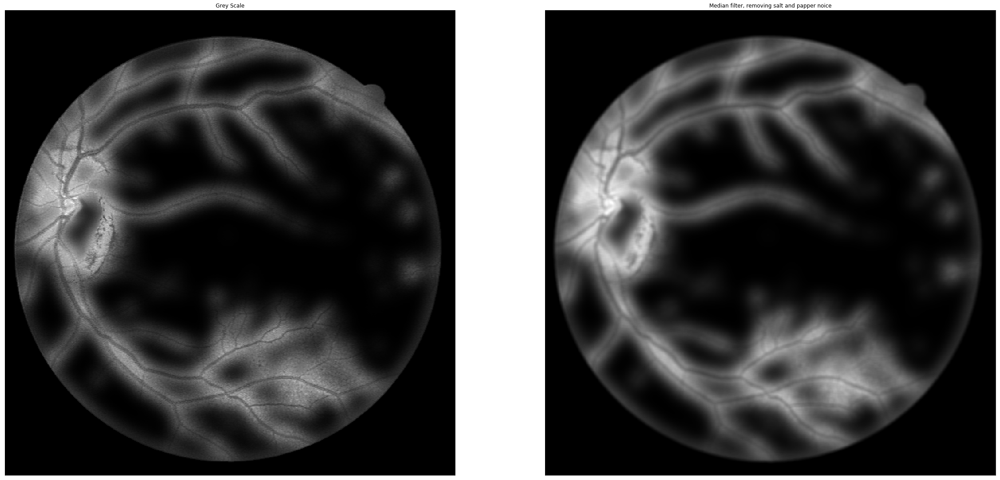

In [17]:
img = new_img

kernel = np.ones((5,5),np.float32)/25
dst2 = cv2.filter2D(img,-1,kernel)
 
plt.figure(figsize=(40,38))
plt.subplot(121),plt.imshow(img,cmap="gray"),plt.title('Grey Scale')
plt.xticks([]), plt.yticks([])
plt.subplot(122),plt.imshow(dst2,cmap="gray"),plt.title('Median filter, removing salt and papper noice')
plt.xticks([]), plt.yticks([])
plt.show()

In [18]:
#image normalization 
#Image2D_normalize = cv2.normalize(dst2,dst, alpha=0, beta=1, norm_type=cv2.NORM_MINMAX, dtype=cv2.CV_32F)
#plt.imshow(Image2D_normalize)

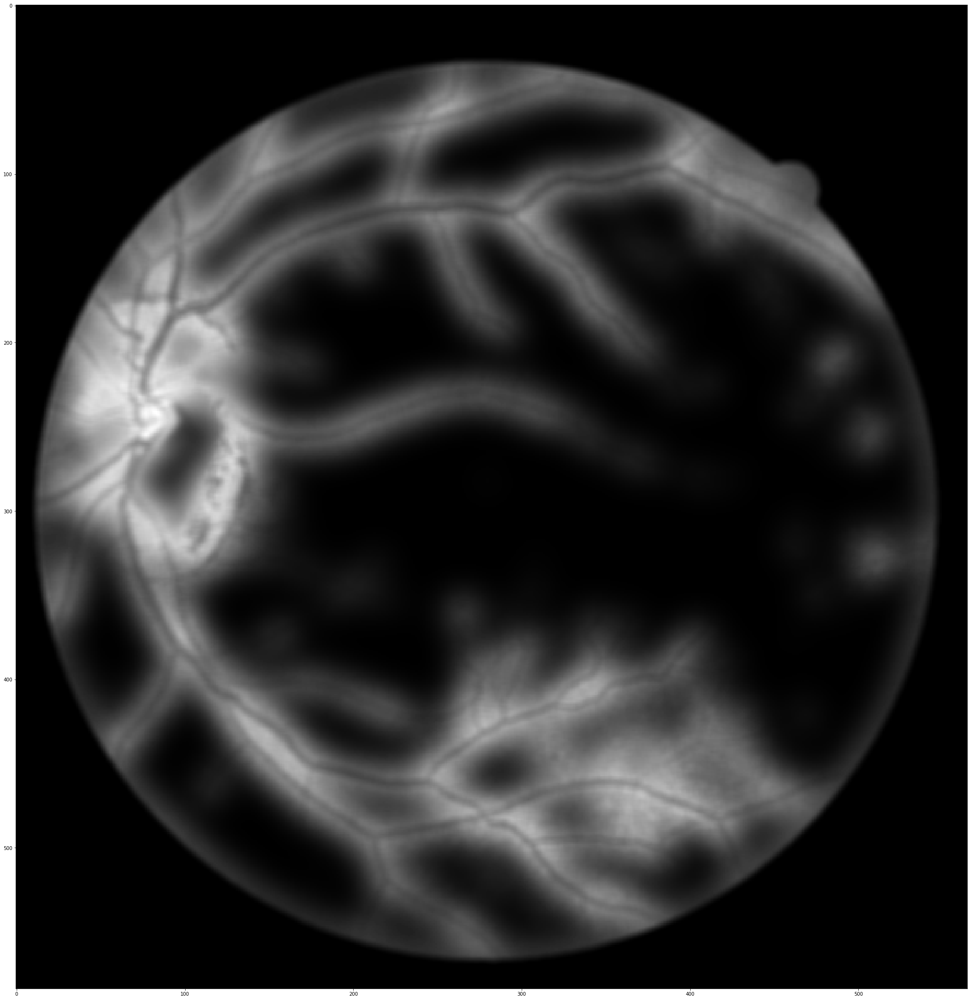

In [19]:
plt.figure(figsize=(40,38))
plt.imshow(dst2,cmap="gray")

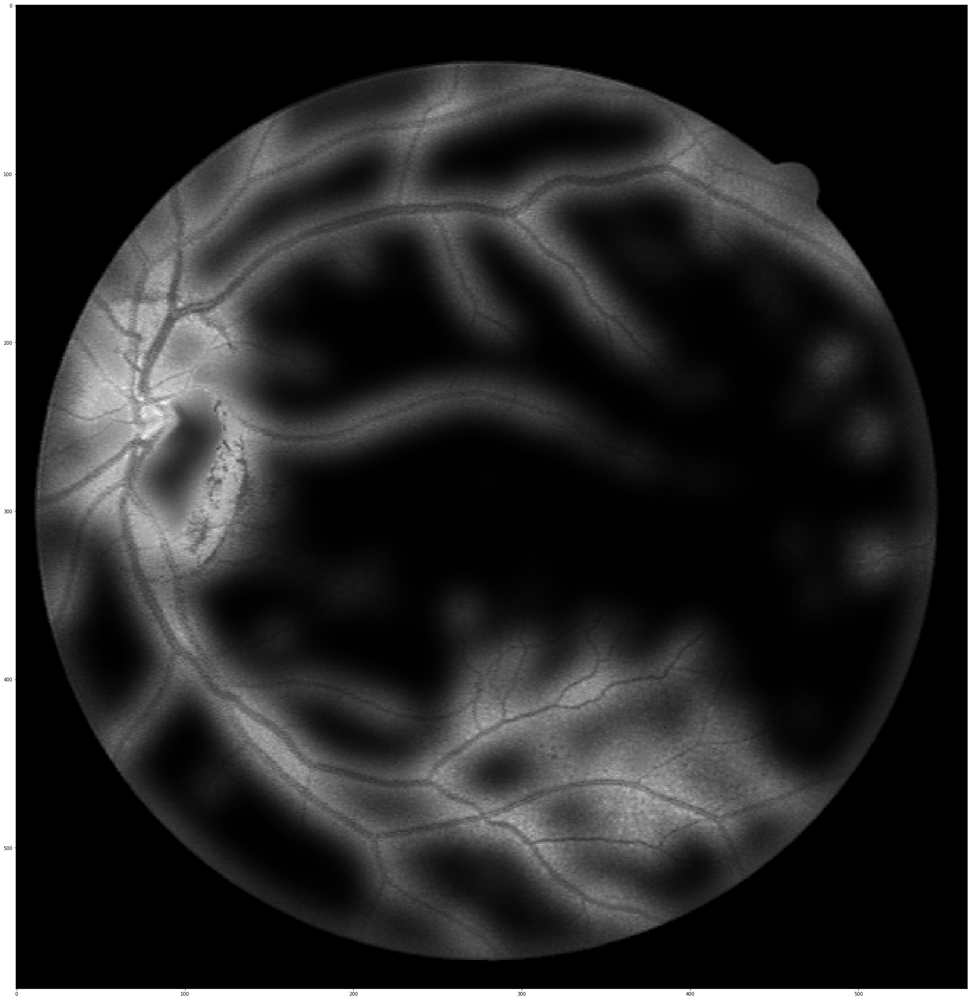

In [20]:
plt.figure(figsize=(40,38))
plt.imshow(img,cmap="gray")

14274.6760326
664437.209552
0.0


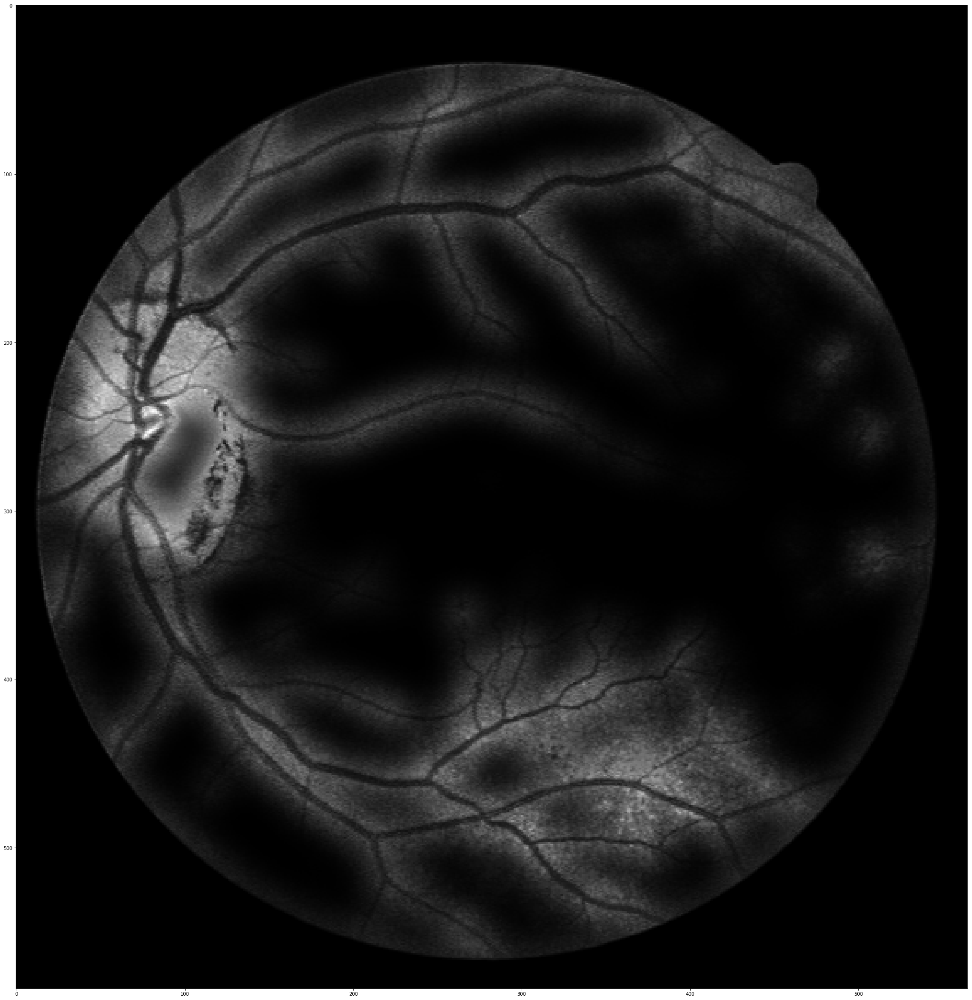

In [21]:
# image above times contrasted image 
new_image = img*cl1
plt.figure(figsize=(40,38))
plt.imshow(new_image,cmap="gray")

v1 = np.median(new_image)
print(v1)
x_maximum = np.matrix(new_image)
print(x_maximum.max())
x = np.matrix(new_image)
print(x.min())

0.0506367118684
1.0
0.0


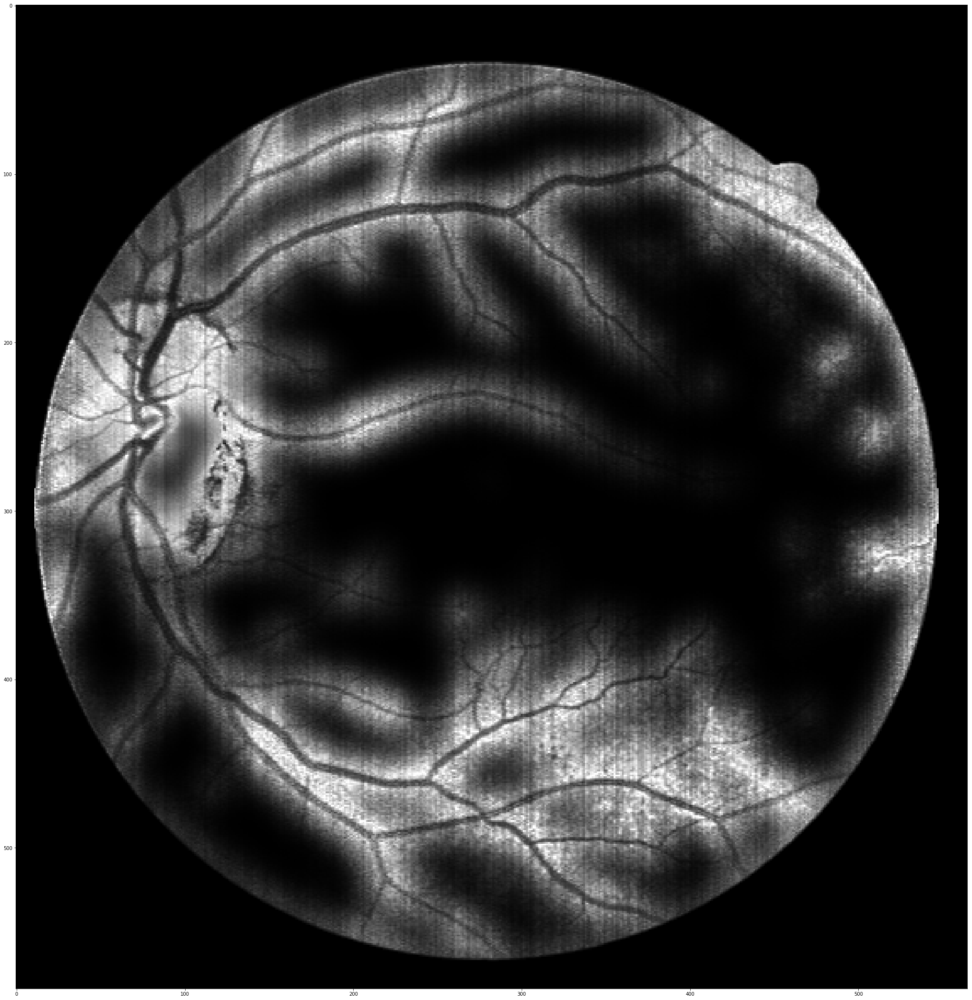

In [22]:
min_max_scaler = preprocessing.MinMaxScaler(feature_range=(0, 1))
normalized = min_max_scaler.fit_transform(new_image)

v1 = np.median(normalized)
print(v1)
x_maximum = np.matrix(normalized)
print(x_maximum.max())
x = np.matrix(normalized)
print(x.min())
plt.figure(figsize=(40,38))
plt.imshow(normalized,cmap="gray")


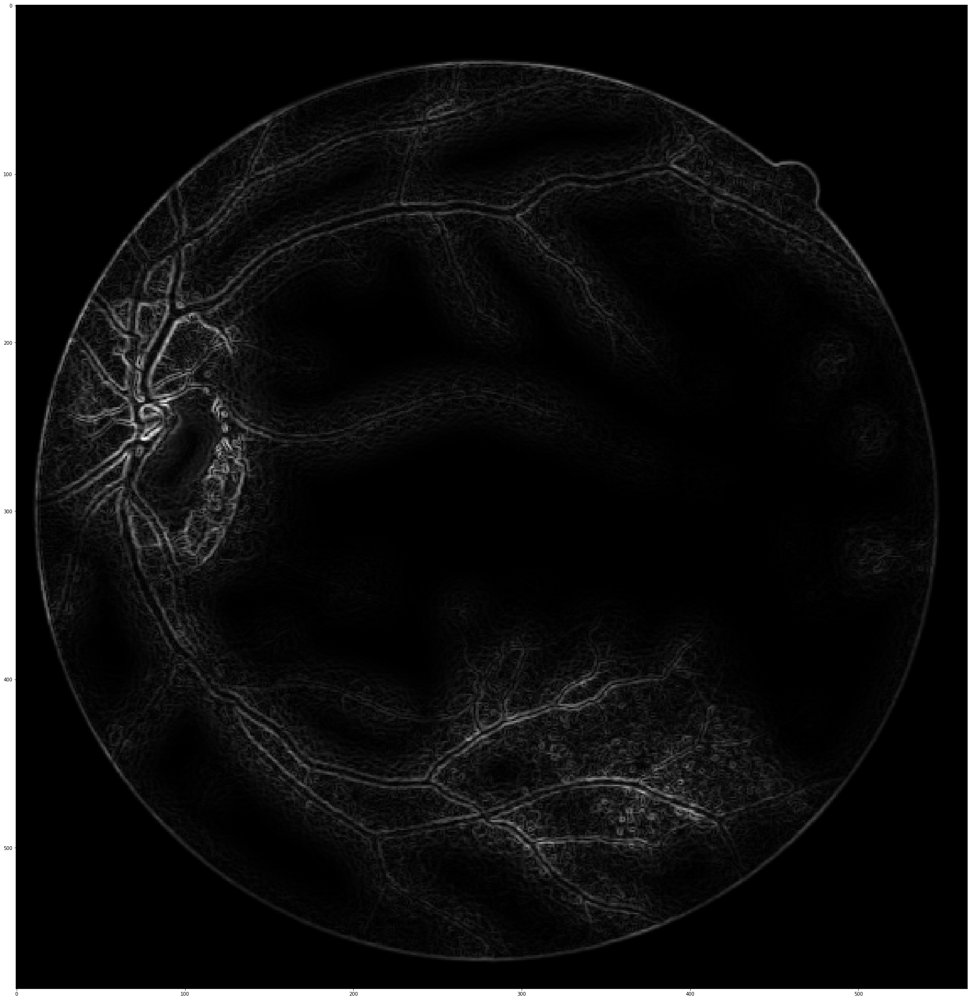

In [23]:
dx = ndimage.sobel(new_image, 0)  # horizontal derivative
dy = ndimage.sobel(new_image, 1)  # vertical derivative
mag = np.hypot(dx, dy)  # magnitude
plt.figure(figsize=(40,38))
plt.imshow(mag,cmap="gray")

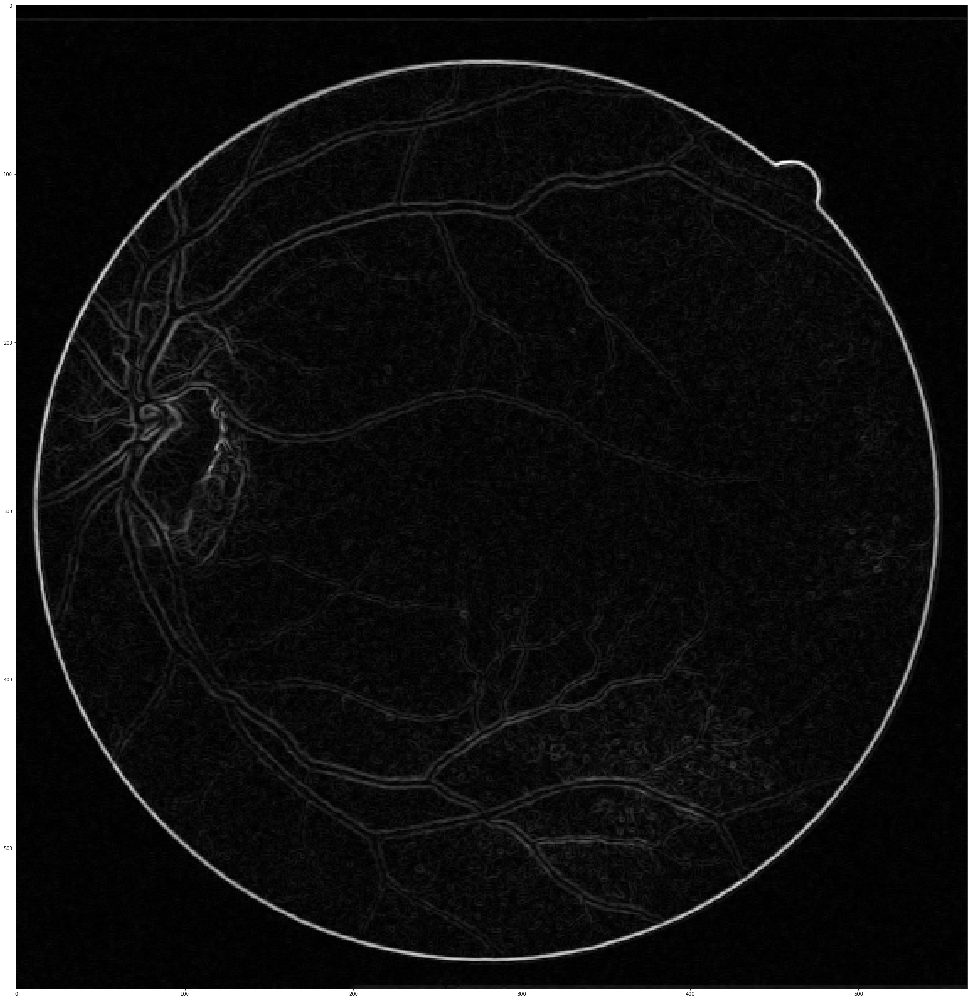

In [24]:
dx2 = ndimage.sobel(retina_grey, 0)  # horizontal derivative
dy2 = ndimage.sobel(retina_grey, 1)  # vertical derivative
mag2 = np.hypot(dx2, dy2)  # magnitude
plt.figure(figsize=(40,38))
plt.imshow(mag2,cmap="gray")

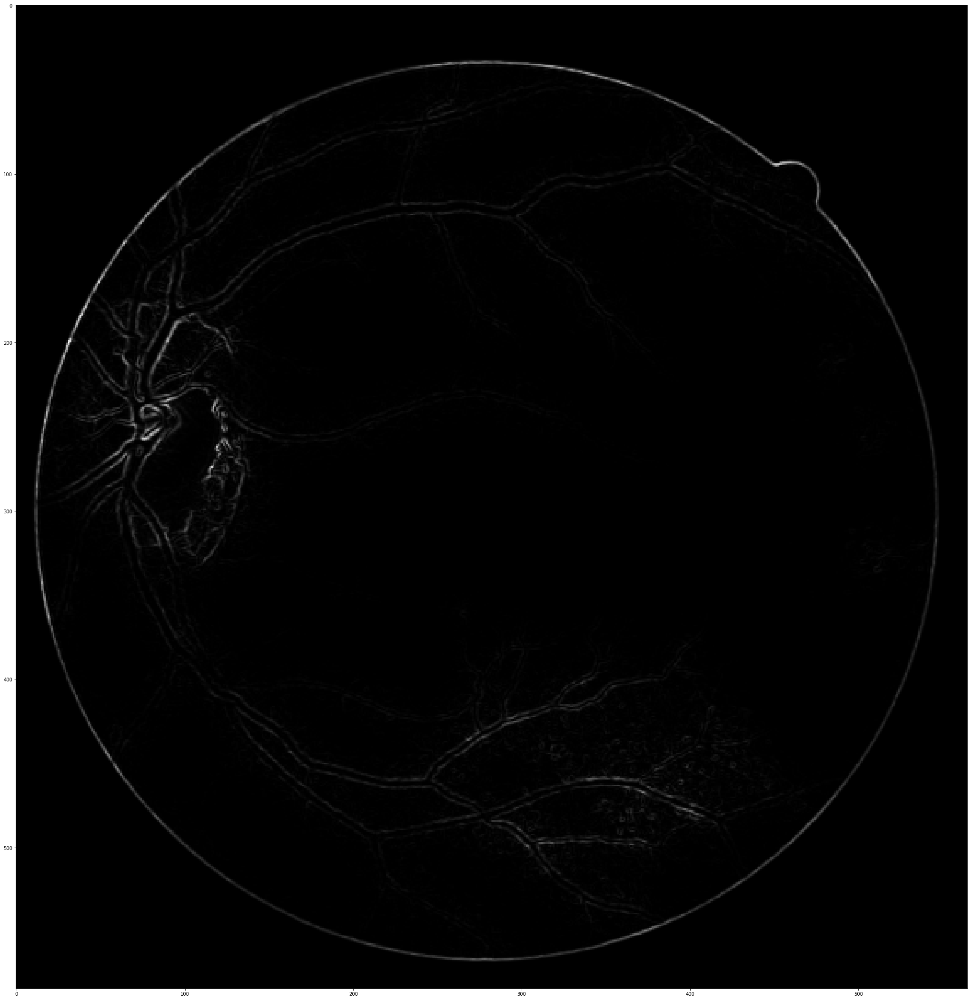

In [25]:
#sobel1*sobel2
sobel3 = mag*mag2
plt.figure(figsize=(40,38))
plt.imshow(sobel3,cmap="gray")

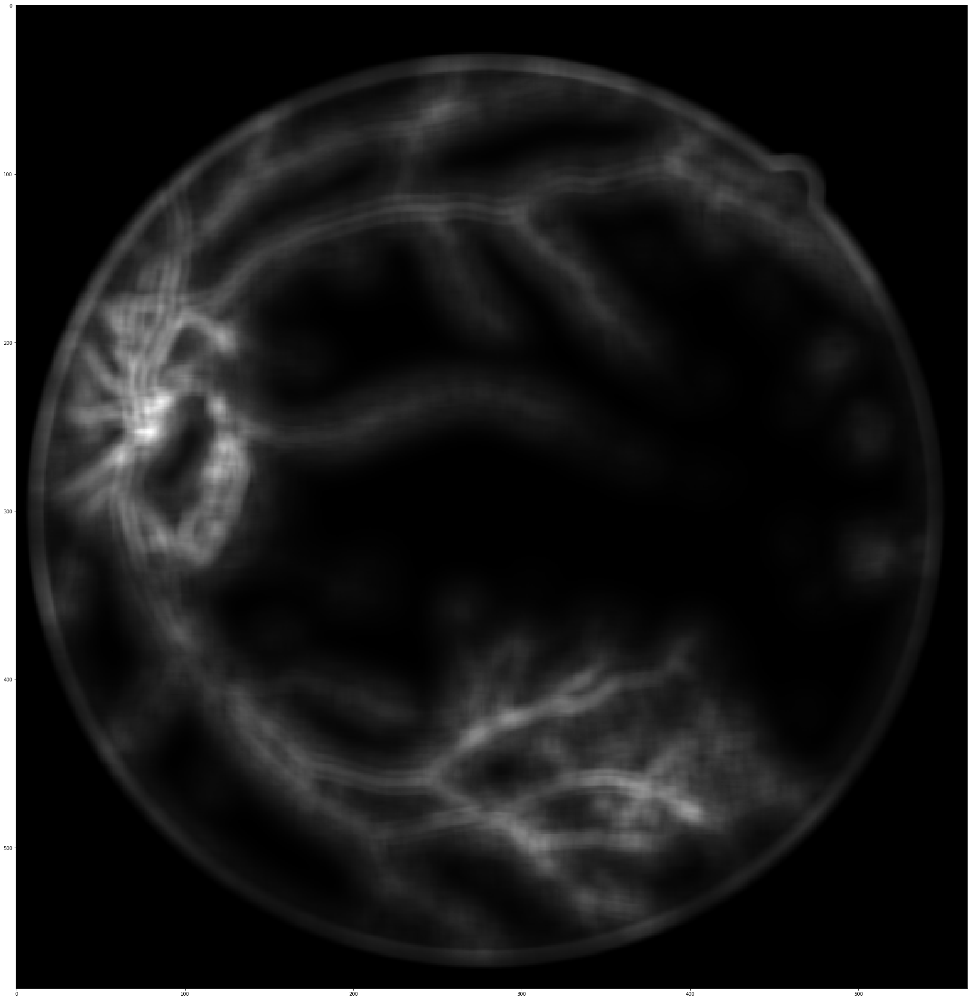

In [26]:
k = np.array([[1,1,1],[1,9,1],[1,1,1]])
k2 = np.array([[-1,-1,-1],[-1,-9,-1],[-1,-1,-1]])/9
k3 = np.array([[1,9,1],[9,9,9],[1,9,1]])
k4 = k = np.array([[1,1,1],[1,1,1],[1,1,1]])/9
k5 = np.array([[1,1,1,1],[1,1,1,1],[1,1,1,1],[1,1,1,1]])/16
k6 = np.ones((10,10),np.uint8)/100

from scipy import ndimage
convolved_image = ndimage.convolve(mag, k6, mode='constant', cval=0.0)
plt.figure(figsize=(40,38))
plt.imshow(convolved_image,cmap="gray")

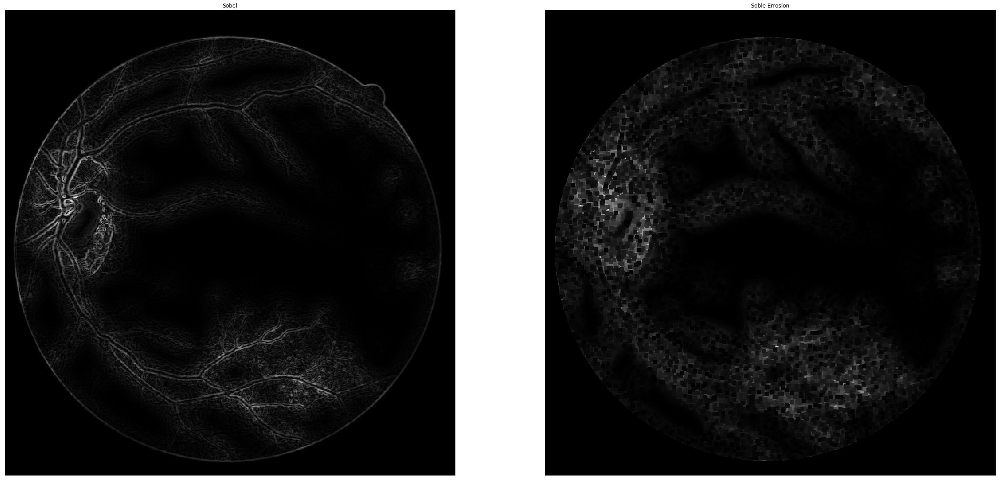

In [27]:
kernel = np.ones((5,5),np.uint8)
erosion = cv2.erode(mag,kernel,iterations = 1)

plt.figure(figsize=(40,38))
plt.subplot(121),plt.imshow(mag,cmap="gray"),plt.title('Sobel')
plt.xticks([]), plt.yticks([])
plt.subplot(122),plt.imshow(erosion,cmap="gray"),plt.title('Soble Errosion')
plt.xticks([]), plt.yticks([])
plt.show()

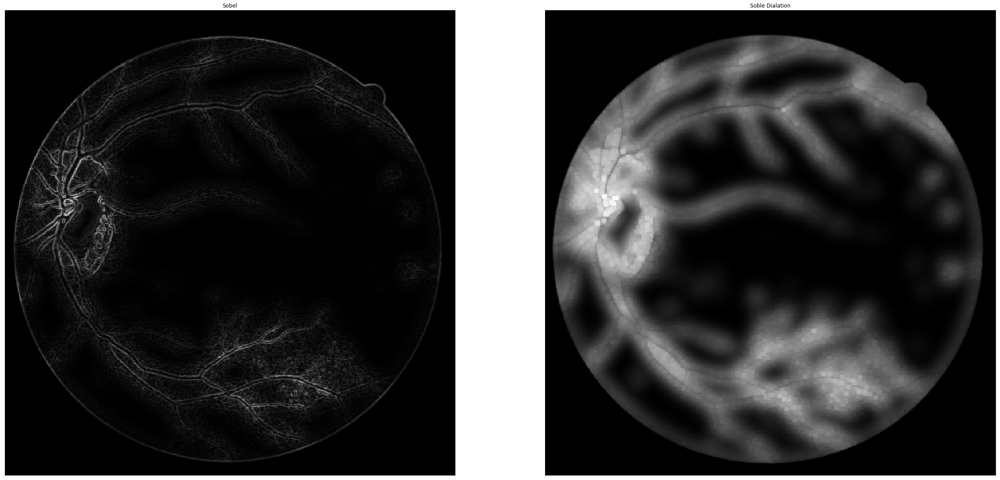

In [28]:
kernel = np.ones((5,5),np.uint8)
dilation = cv2.dilate(img,kernel,iterations = 1)

plt.figure(figsize=(40,38))
plt.subplot(121),plt.imshow(mag,cmap="gray"),plt.title('Sobel')
plt.xticks([]), plt.yticks([])
plt.subplot(122),plt.imshow(dilation,cmap="gray"),plt.title('Soble Dialation')
plt.xticks([]), plt.yticks([])
plt.show()

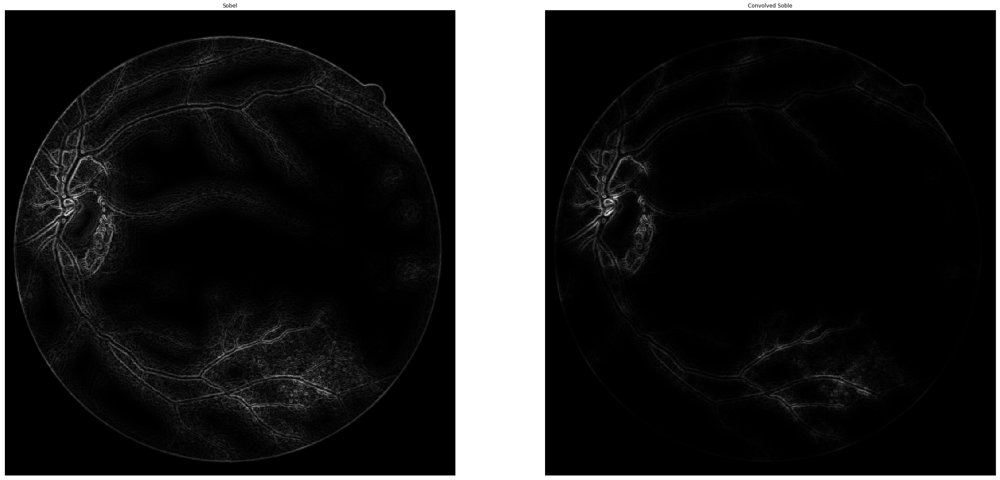

In [29]:
conv_sobel = convolved_image*mag

plt.figure(figsize=(40,38))
plt.subplot(121),plt.imshow(mag,cmap="gray"),plt.title('Sobel')
plt.xticks([]), plt.yticks([])
plt.subplot(122),plt.imshow(conv_sobel,cmap="gray"),plt.title('Convolved Soble')
plt.xticks([]), plt.yticks([])
plt.show()

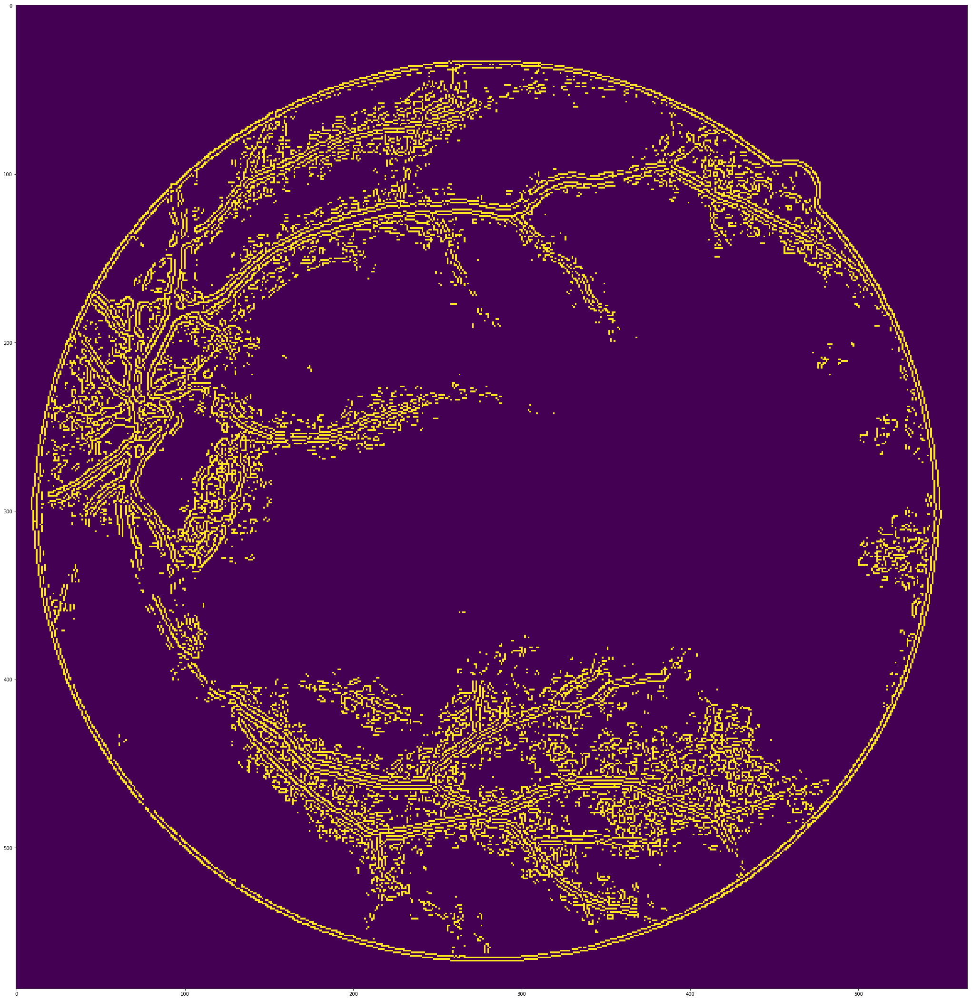

In [30]:
min_max_scaler = preprocessing.MinMaxScaler(feature_range=(0, 255))
normalized = min_max_scaler.fit_transform(mag)

# doing canny again 
imgcast= np.uint8(normalized)
plt.figure(figsize=(40,38))
edges_sobel = cv2.Canny(imgcast,200,220)
plt.imshow(edges_sobel)

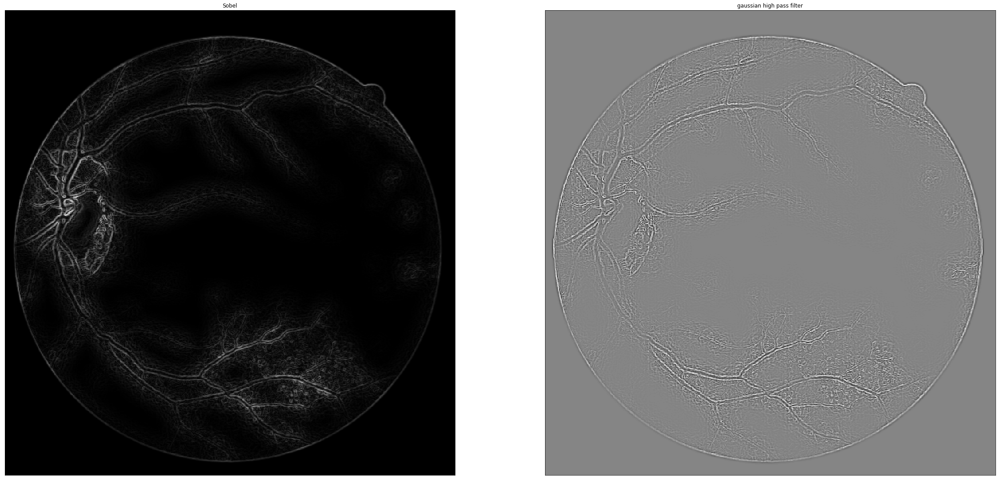

In [31]:
lowpass = ndimage.gaussian_filter(normalized, 1)
gauss_highpass = normalized - lowpass

plt.figure(figsize=(40,38))
plt.subplot(121),plt.imshow(mag,cmap="gray"),plt.title('Sobel')
plt.xticks([]), plt.yticks([])
plt.subplot(122),plt.imshow(gauss_highpass,cmap="gray"),plt.title('gaussian high pass filter')
plt.xticks([]), plt.yticks([])
plt.show()

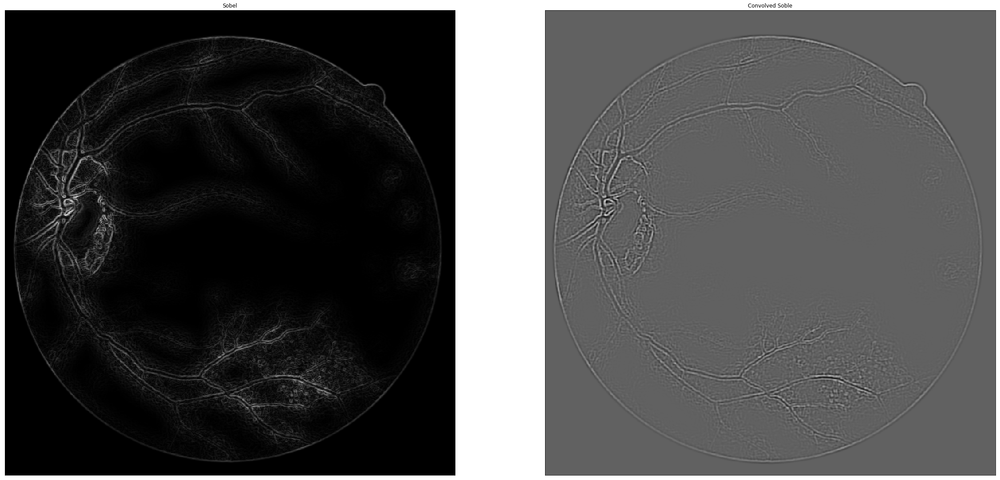

In [32]:
kernel = np.array([[-1, -1, -1, -1, -1],
                   [-1,  1,  2,  1, -1],
                   [-1,  2,  4,  2, -1],
                   [-1,  1,  2,  1, -1],
                   [-1, -1, -1, -1, -1]])
highpass_5x5 = ndimage.convolve(mag, kernel)
plt.figure(figsize=(40,38))
plt.subplot(121),plt.imshow(mag,cmap="gray"),plt.title('Sobel')
plt.xticks([]), plt.yticks([])
plt.subplot(122),plt.imshow(highpass_5x5,cmap="gray"),plt.title('Convolved Soble')
plt.xticks([]), plt.yticks([])
plt.show()

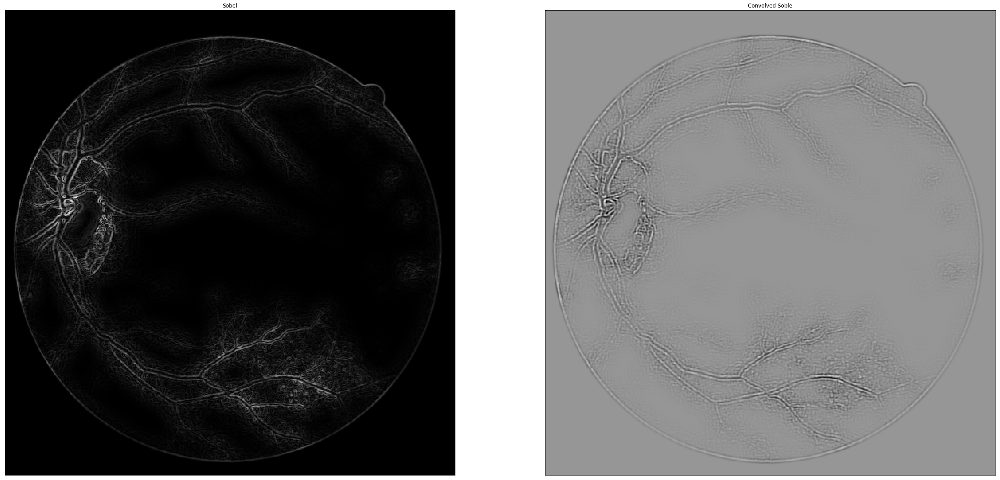

In [33]:
kernel = np.array([[-2, -2, -2, -2, -2],
                   [-2,  2,  3,  2, -2],
                   [-2,  3,  5,  3, -2],
                   [-2,  2,  2,  2, -2],
                   [-2, -2, -2, -2, -2]])
highpass_5x5 = ndimage.convolve(mag, kernel)
plt.figure(figsize=(40,38))
plt.subplot(121),plt.imshow(mag,cmap="gray"),plt.title('Sobel')
plt.xticks([]), plt.yticks([])
plt.subplot(122),plt.imshow(highpass_5x5,cmap="gray"),plt.title('Convolved Soble')
plt.xticks([]), plt.yticks([])
plt.show()

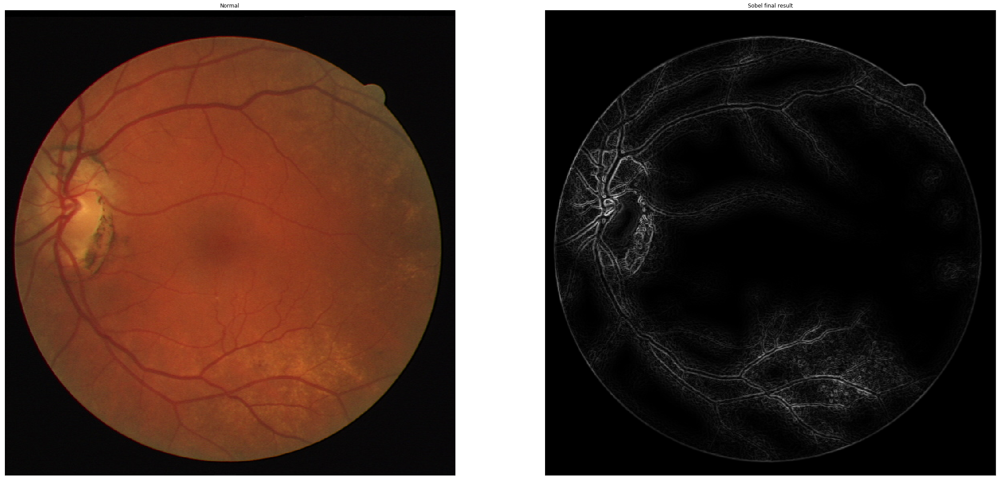

In [34]:
plt.figure(figsize=(40,38))
plt.subplot(121),plt.imshow(retina),plt.title('Normal')
plt.xticks([]), plt.yticks([])
plt.subplot(122),plt.imshow(mag,cmap="gray"),plt.title('Sobel final result')
plt.xticks([]), plt.yticks([])
plt.show()

/Applications/anaconda3/lib/python3.6/site-packages/skimage/util/dtype.py:122: UserWarning: Possible precision loss when converting from float64 to uint8
  .format(dtypeobj_in, dtypeobj_out))


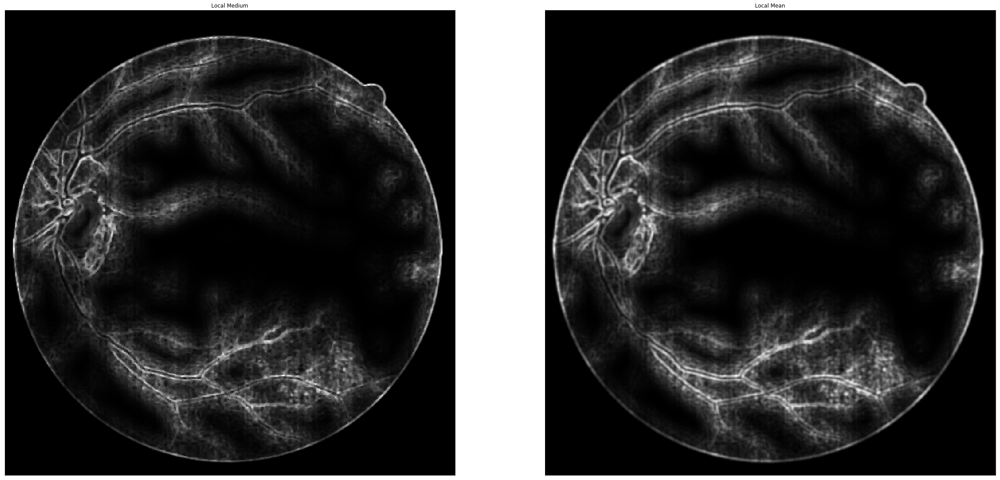

In [35]:
min_max_scaler = preprocessing.MinMaxScaler(feature_range=(0, 1))
normalized = min_max_scaler.fit_transform(mag)

structuring_element = morphology.disk(2)

loc_med = filters.rank.median(normalized,structuring_element)
loc_mean = filters.rank.mean(normalized,structuring_element)

plt.figure(figsize=(40,38))
plt.subplot(121),plt.imshow(loc_med,cmap="gray"),plt.title('Local Medium')
plt.xticks([]), plt.yticks([])
plt.subplot(122),plt.imshow(loc_mean,cmap="gray"),plt.title('Local Mean')
plt.xticks([]), plt.yticks([])
plt.show()

/Applications/anaconda3/lib/python3.6/site-packages/skimage/util/dtype.py:122: UserWarning: Possible precision loss when converting from float64 to uint16
  .format(dtypeobj_in, dtypeobj_out))


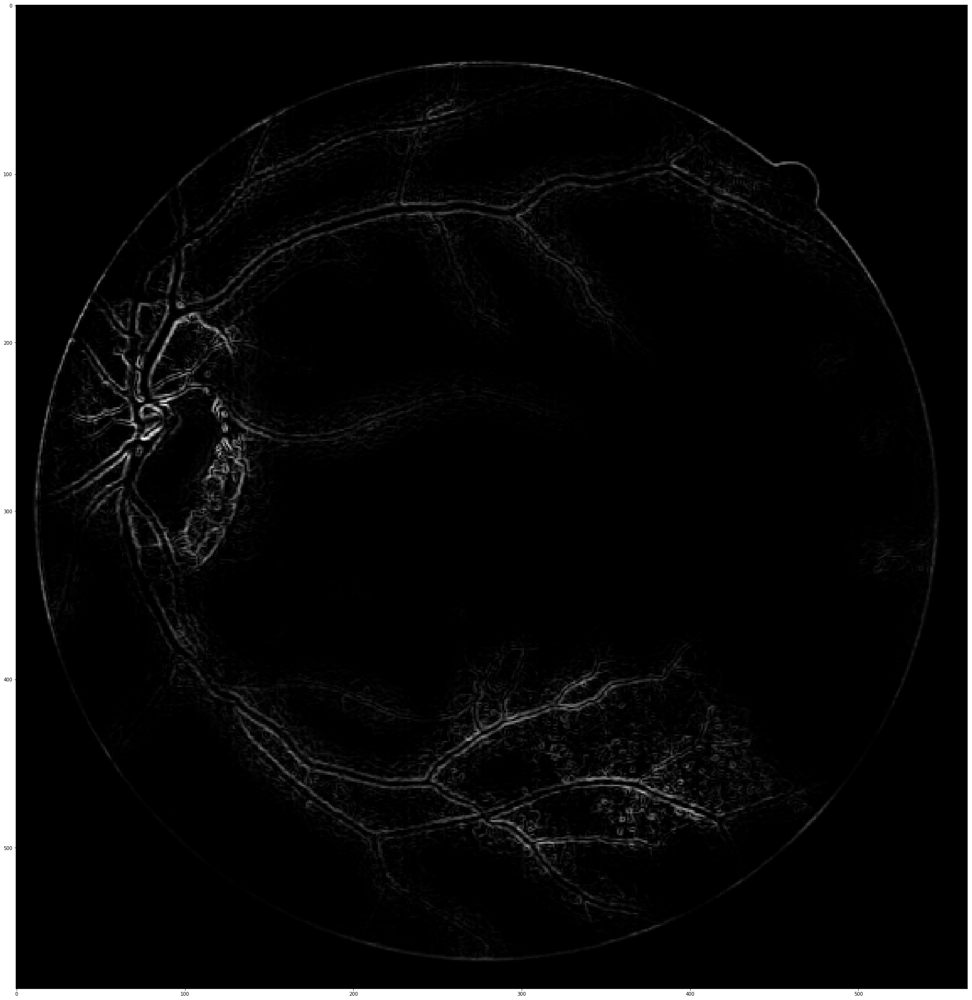

In [36]:
img_adapteq = exposure.equalize_adapthist(normalized, clip_limit=0.03)
plt.figure(figsize=(40,38))
plt.imshow(img_adapteq*img_adapteq*img_adapteq*mag,cmap="gray")

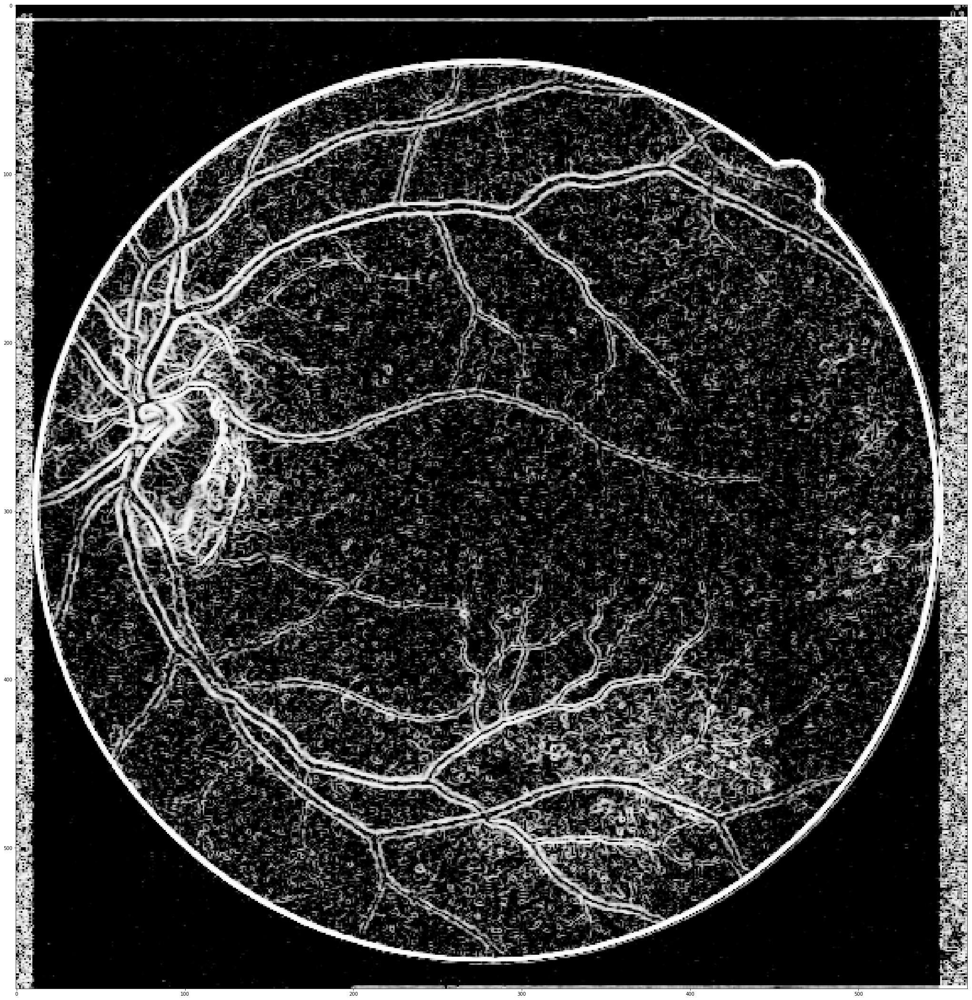

In [37]:
product_mag = mag2*mag2

min_max_scaler = preprocessing.MinMaxScaler(feature_range=(0, 1))
normalized = min_max_scaler.fit_transform(product_mag)

img_adapteq = exposure.equalize_hist(normalized)
plt.figure(figsize=(40,38))
plt.imshow(img_adapteq,cmap="gray")

/Applications/anaconda3/lib/python3.6/site-packages/skimage/util/dtype.py:122: UserWarning: Possible precision loss when converting from float64 to uint8
  .format(dtypeobj_in, dtypeobj_out))


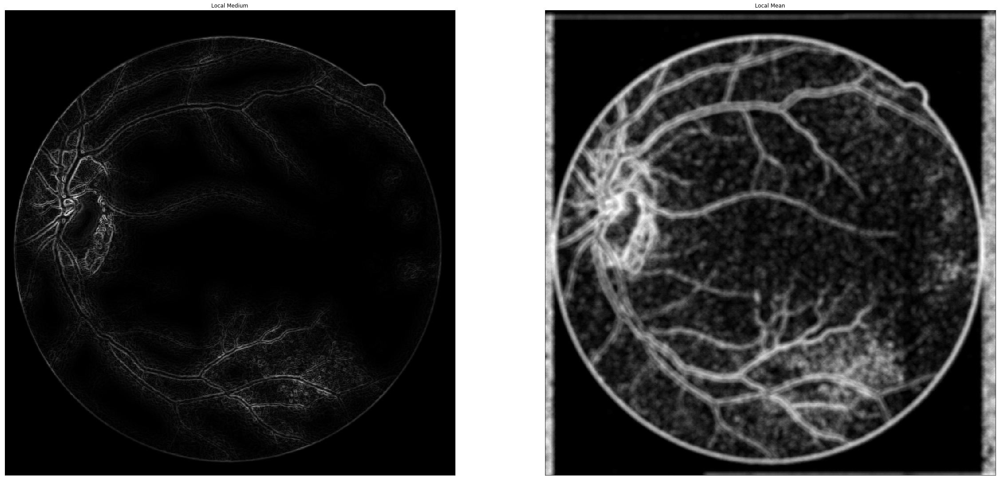

In [38]:
structuring_element = morphology.disk(4)

loc_med = filters.rank.median(img_adapteq,structuring_element)
loc_mean = filters.rank.mean(img_adapteq,structuring_element)

plt.figure(figsize=(40,38))
plt.subplot(121),plt.imshow(mag*loc_mean,cmap="gray"),plt.title('Local Medium')
plt.xticks([]), plt.yticks([])
plt.subplot(122),plt.imshow(loc_mean,cmap="gray"),plt.title('Local Mean')
plt.xticks([]), plt.yticks([])
plt.show()

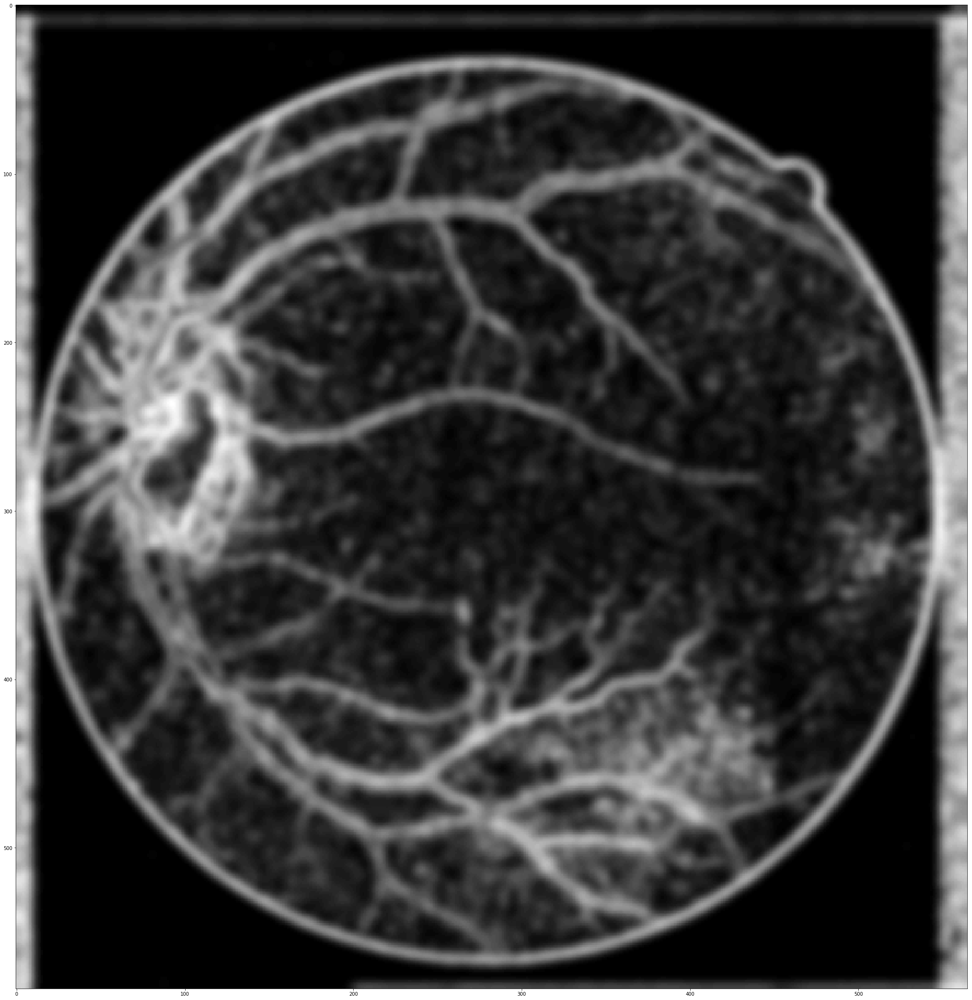

In [39]:
#Bilateral blure 
min_max_scaler = preprocessing.MinMaxScaler(feature_range=(0, 255))
normalized = min_max_scaler.fit_transform(mag)

imgcast= np.uint8(normalized)

blur = cv2.bilateralFilter(loc_mean,9,75,75)

plt.figure(figsize=(40,38))
plt.imshow(blur,cmap="gray")

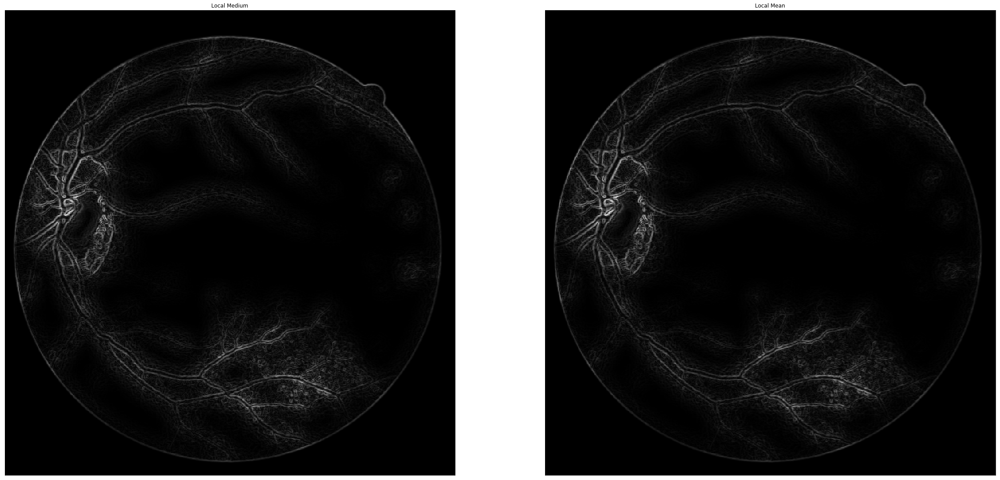

In [40]:
bilateral_times_sobel = blur*mag

plt.figure(figsize=(40,38))
plt.subplot(121),plt.imshow(mag,cmap="gray"),plt.title('Local Medium')
plt.xticks([]), plt.yticks([])
plt.subplot(122),plt.imshow(bilateral_times_sobel,cmap="gray"),plt.title('Local Mean')
plt.xticks([]), plt.yticks([])
plt.show()


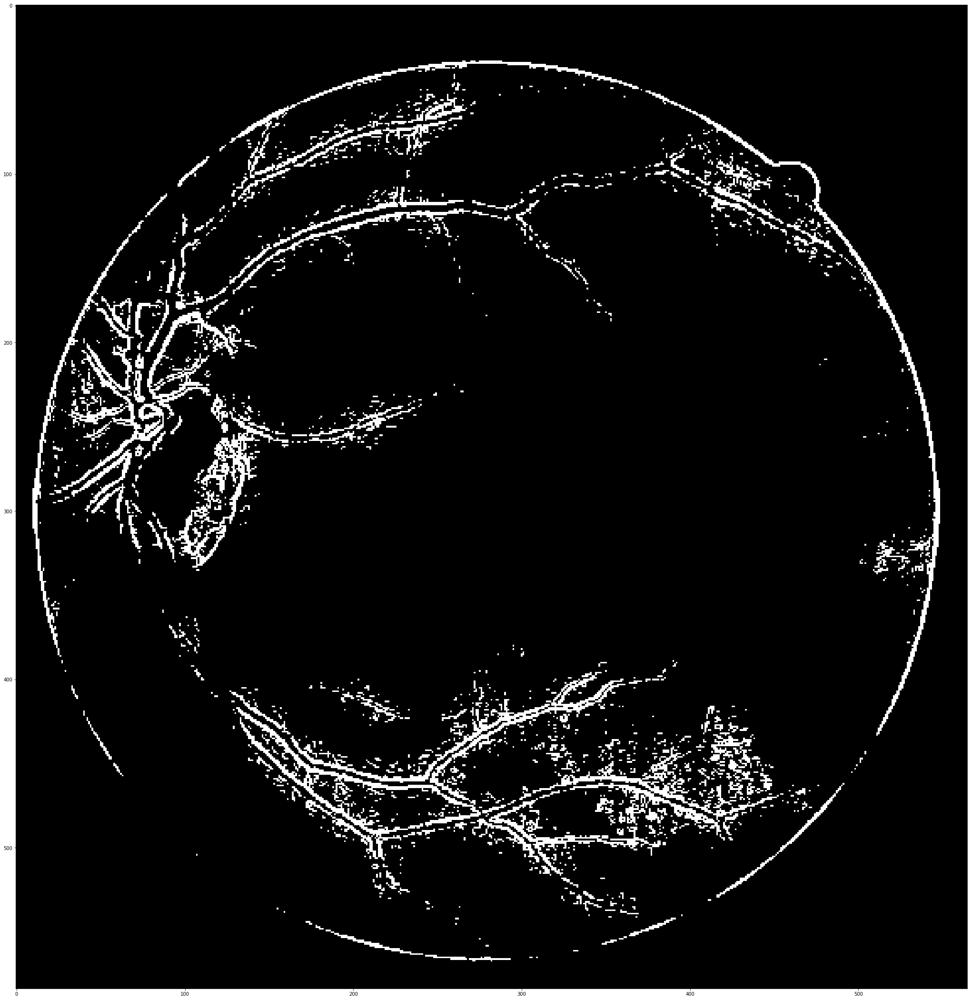

In [41]:
min_max_scaler = preprocessing.MinMaxScaler(feature_range=(0, 255))
normalized = min_max_scaler.fit_transform(mag)

retval, threshold = cv2.threshold(normalized,90,100,cv2.THRESH_BINARY)
plt.figure(figsize=(40,38))
plt.imshow(threshold,cmap="gray")

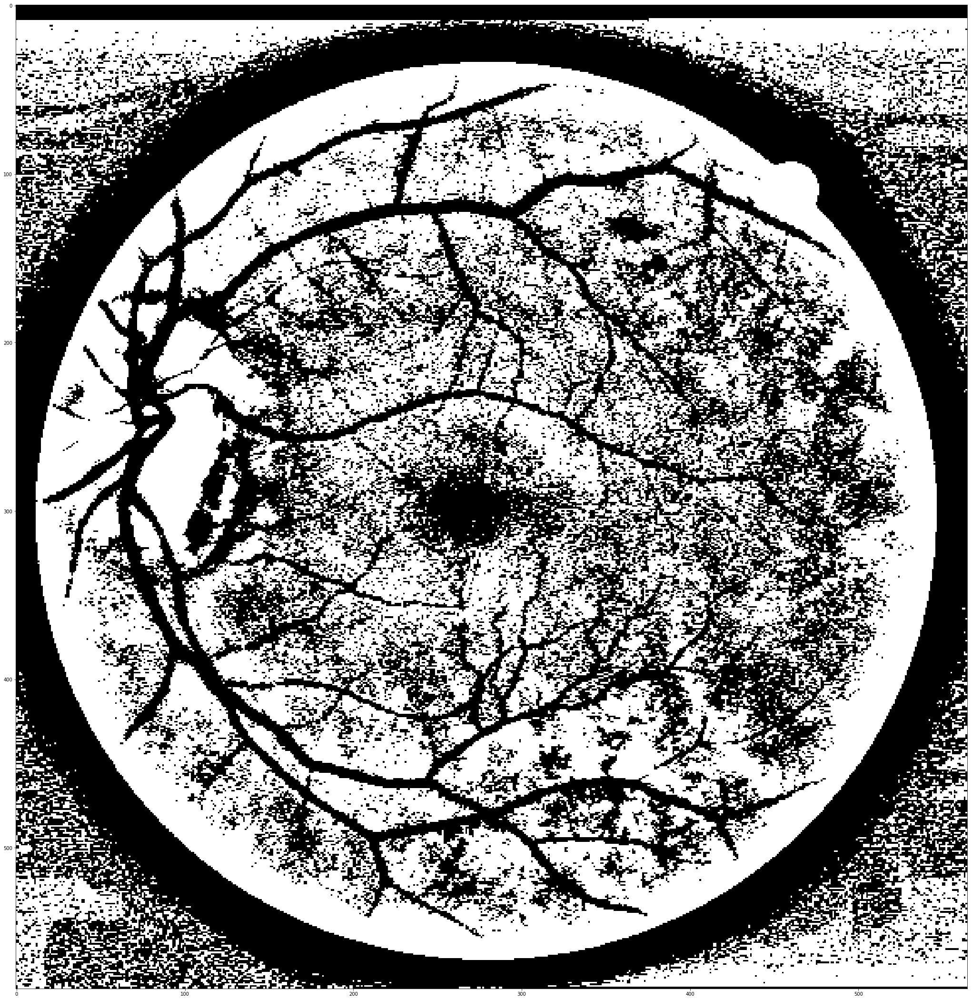

In [48]:
# gaussian adaptive
#grayscaled = cv2.cvtColor(normalized,cv2.COLOR_BGR2GRAY)
#retval2,threshold2 = cv2.threshold(grayscaled,12,255,cv2.THRESH_BINARY)
gaus = cv2.adaptiveThreshold(cl1,255,cv2.ADAPTIVE_THRESH_GAUSSIAN_C,cv2.THRESH_BINARY,115,1)
plt.figure(figsize=(40,38))
plt.imshow(gaus,cmap="gray")

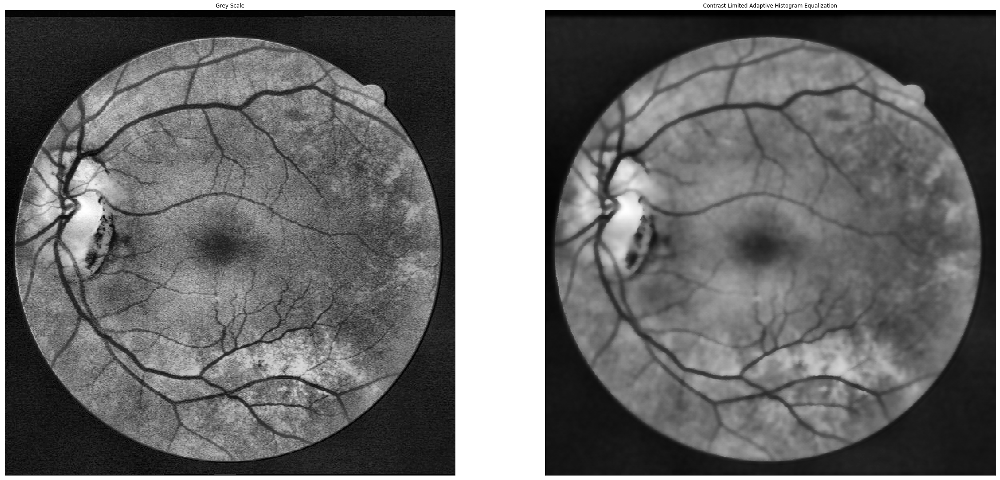

In [43]:
blur = cv2.bilateralFilter(cl2,9,75,75)

plt.figure(figsize=(40,38))
plt.subplot(121),plt.imshow(cl2,cmap="gray"),plt.title('Grey Scale')
plt.xticks([]), plt.yticks([])
plt.subplot(122),plt.imshow(blur,cmap="gray"),plt.title('Contrast Limited Adaptive Histogram Equalization')
plt.xticks([]), plt.yticks([])
plt.show()

